# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Введение в анализ данных" </center>

# <center> Лабораторная работа №2. Кластерный анализ. </center>

# Part 1

В данном задании вам необходимо **самостоятельно** реализовать один из алгоритмов кластеризации.  
По аналогии с классами в scikit-learn, нужно реализовать класс, наследуемый от [Base Estimator](https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html).  
Подробнее про реализацию своих моделей в scikit-learn: [here](https://scikit-learn.org/stable/developers/develop.html#rolling-your-own-estimator).  
В классе помимо `__init__()` нужно реализовать два метода:
 - `fit()` - метод, выполняющий кластеризацию данных.
 - `predict()` - метод, определяющий для нового объекта, к какому из кластеров он относится. 
 
Для удобства можно создавать дополнительные методы класса, которые будут вызываться в `fit()` или `predict()`.  <br>
Функции для вычисления расстояний *между объектами* самим реализовывать не нужно, используйте реализации из `scipy`.

### Imports

In [1]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, ClusterMixin
from scipy.spatial import distance
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift
from scipy.cluster import hierarchy
from tabulate import tabulate as tb
import itertools
import enum
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [2]:
def print_dict(d: dict, key_label = 'Key', item_label = 'Item'):
    print(tb(d.items(), headers = [key_label, item_label]))

In [3]:
pd.set_option('display.max_colwidth', None)

In [4]:
import warnings
warnings.filterwarnings('ignore')

# MyDBSCAN

In [5]:
def get_condensed_distance(pair, condensed_matrix):
    i, j = pair
    size = condensed_matrix.size
    if i == j or not 0 <= i < size or not 0 <= j < size:
        return None
    pair = (i, j) if i <= j else (j, i)
    index = list(itertools.combinations(range(size),2)).index(pair)
    return condensed_matrix[index]

In [6]:
class MyDBSCAN(BaseEstimator, ClusterMixin):
    """
    My implementation of DBSCAN clustering algorithm
    """

    def __init__(self, eps=0.5, min_samples=5, metric='euclidean',  metric_params=None):
        """
        Initialize MyDBSCAN with algorithm's params
        :param eps: (float) neighborhood range
        :param min_samples: (int) core object definition condition
        :param metric: (str) distance metric, or callable
        :param metric_params: (dict) additional params for metrics
        """
        self.eps = eps
        self.min_samples = min_samples
        self.metric = metric
        self.metric_params = metric_params if metric_params else {}

        self.labels_ = None
        self.core_sample_coords_ = None
        self.core_sample_indices_ = None
        self._objects_states_ = None

    class ObjectState(enum.Enum):
        outlier = -1
        reachable = 0
        core = 1

    def _define_clusters(self, objects_states: list, neighbours: list):
        """
        Define clusters based on objects' states (core, reachable, outlier)
        :param objects_states: list of ObjectState type; size of objects' num in dataset
        :param neighbours: nested list where all neighbours of objects (indexes) are listed
        :return: labels (np.array)
        """
        size = len(objects_states)
        new_labels = np.full(size, -1, dtype=int)
        cur_label = 0
        for object_i in range(size):
            if new_labels[object_i] != -1 or objects_states[object_i] is not self.ObjectState.core:
                continue
            my_stack = list()
            depth_i = object_i

            # depth search of connected objects
            while True:
                if new_labels[depth_i] == -1:
                    new_labels[depth_i] = cur_label
                    if objects_states[depth_i] is self.ObjectState.core:
                        for neighbour in neighbours[depth_i]:
                            if new_labels[neighbour] == -1:
                                my_stack.append(neighbour)
                if not len(my_stack):
                    break
                else:
                    depth_i = my_stack.pop()
            cur_label += 1

        return new_labels

    @staticmethod
    def _find_neighbours(X, eps, objects_num):
        """
        Find all neighbours for objects
        :param X: condensed distance matrix
        :param eps: neighborhood range - max distance for defining neighbor
        :param objects_num: number of objects
        :return: nested list where all neighbours of objects (indexes) are listed
        """
        neighbours = [[] for i in range(objects_num)]
        for pair, dist in zip(itertools.combinations(range(objects_num), 2), X):
            if dist <= eps:
                i, j = pair
                neighbours[j].append(i)
                neighbours[i].append(j)
        return neighbours

    def fit(self, X, y=None):
        """
        Define clusters based on DBSCAN algorithm
        :param X: np.array(shape=(samples, features)) of objects to cluster or distance_matrix
        :param y: Ignore
        :return: self
        """
        if self.metric == 'precomputed':
            distance_matrix = distance.squareform(X)
        else:
            distance_matrix = distance.pdist(X=X, metric=self.metric, **self.metric_params)
        size = X.shape[0]
        neighbours = self._find_neighbours(distance_matrix, self.eps, size)
        self._objects_states_ = [self.ObjectState.outlier] * size
        self.core_sample_coords_ = []
        self.core_sample_indices_ = []
        # define core objects
        for object_i in range(size):
            if len(neighbours[object_i]) + 1 >= self.min_samples:
                self._objects_states_[object_i] = self.ObjectState.core
                if self.metric != 'precomputed':
                    self.core_sample_coords_.append(X[object_i])
                    self.core_sample_indices_.append(object_i)
        # define reachable objects
        for object_i in range(size):
            if self._objects_states_[object_i] is self.ObjectState.core:
                continue
            for neighbour in neighbours[object_i]:
                if self._objects_states_[neighbour] is self.ObjectState.core:
                    self._objects_states_[object_i] = self.ObjectState.reachable
                    break
        # define clusters
        self.labels_ = self._define_clusters(self._objects_states_, neighbours)
        return self

    def fit_predict(self, X, y=None):
        """
        Define clusters based on DBSCAN algorithm and return labels
        :param X: np.array(shape=(samples, features)) or distance_matrix
        :param y: Ignore
        :return: np.array(shape=samples) labels of defined clusters
        """
        self.fit(X)
        return self.labels_

    def predict(self, X):
        """
        Predict cluster based on fitted MyDBSCAN
        :param X: np.array(shape=(samples, features)) of objects to predict cluster
        :return: labels for every object
        """
        if self.metric == 'precomputed':
            raise RuntimeError("MyDBSAN has been initialized with precomputed distance matrix. Cannot predict")
        if self.labels_ is None:
            raise RuntimeError("MyDBSAN must be fitted to predict")
        size = X.shape[0]
        dist_matrix = distance.cdist(X, self.core_sample_coords_)
        new_labels_ = np.full(size, -1, dtype=int)
        for object_i in range(size):
            unique_labels = set(self.labels_) - {-1}
            cluster_candidates = {label: 0 for label in unique_labels}
            for core_i in range(len(self.core_sample_coords_)):
                if dist_matrix[object_i][core_i] <= self.eps:
                    cur_label = self.labels_[self.core_sample_indices_[core_i]]
                    cluster_candidates[cur_label] += 1
            better_cluster, cluster_score = sorted(cluster_candidates.items(), key=lambda x: x[1])[-1]
            if cluster_score != 0:
                new_labels_[object_i] = better_cluster
        return new_labels_

    def get_params(self, deep=True):
        return {
            "eps": self.eps,
            "min_samples": self.min_samples,
            "metric": self.metric,
            "metric_params": self.metric_params
        }

    def set_params(self, **params):
        for parameter, value in params.items():
            setattr(self, parameter, value)

### Вариант №2

Алгоритм Dbscan.  
  
Параметры: 
- **eps:** радиус окрестности $\varepsilon$;  
- **min_samples:** минимальное число объектов в окрестности $\varepsilon$ для основных точек;  
- **metric:** функция расстояния между объектами. Должны поддерживаться метрики из `scipy.spatial.distance`, самописные функции (callable) и предрассчитанная матрица расстояний.   
- **metric_params:** параметры функции расстояния, если такие есть. 
  
Атрибуты:  
- **core\_sample\_coords\_:** - векторы основных точек;
- **labels_:** метки кластеров для каждого объекта.
  
Метод `predict()`:  Для нового объекта вычисляется число основных точек из каждого кластера, попавших в окрестность $\varepsilon$. Объект определяется в кластер с наибольшим числом таких точек.  
**Note:** Метод `predict()` не выполняется в случае, когда **metric** - это матрица расстояний. 

### Testing 

Вашу реализацию необходимо сравнить с питоновской реализацией алгоритма из `sklearn` или `scipy`. Результаты кластеризации должны совпадать.  
Также необходимо сравнить скорость работы вашей реализации и питоновской (это нормально, если ваша реализация будет медленнее).  
Сравнение необходимо выполнить на наборе данных iris.

In [7]:
iris = load_iris()
X_train = iris.data 
y = iris.target 

In [8]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [9]:
X = pd.DataFrame(X_train, columns=iris.feature_names)
X['class'] = [iris.target_names[i] for i in y]

In [10]:
X

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),class
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


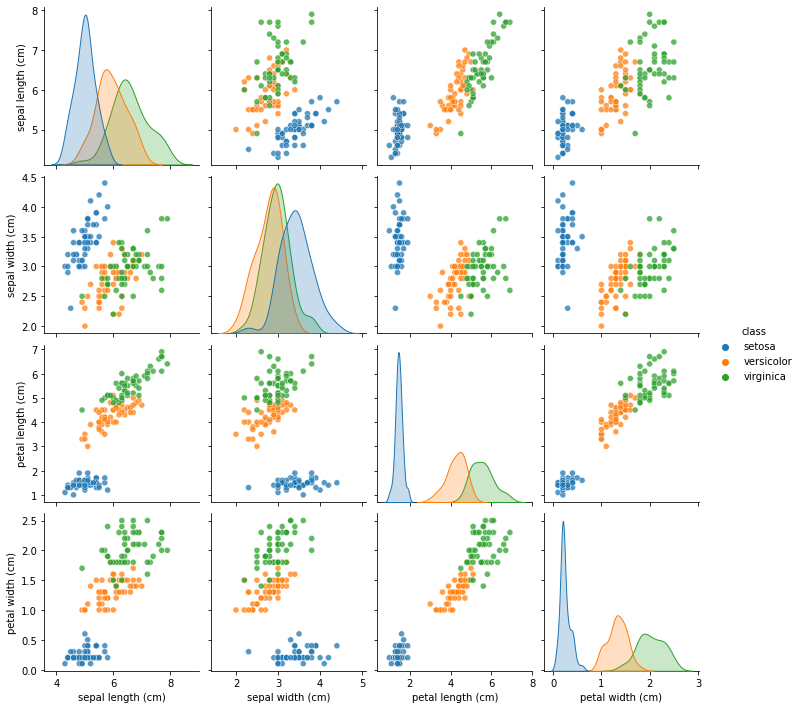

In [11]:
sns.pairplot(X, hue='class', plot_kws={'alpha':0.75}, vars=iris.feature_names)
plt.show()

Scaling dataset

In [12]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)

In [13]:
scaled_data = pd.DataFrame()
for label, i in zip(iris.feature_names, range(len(iris.feature_names))):
    scaled_data[label] = X_train[:, i]
scaled_data['class'] = X['class']

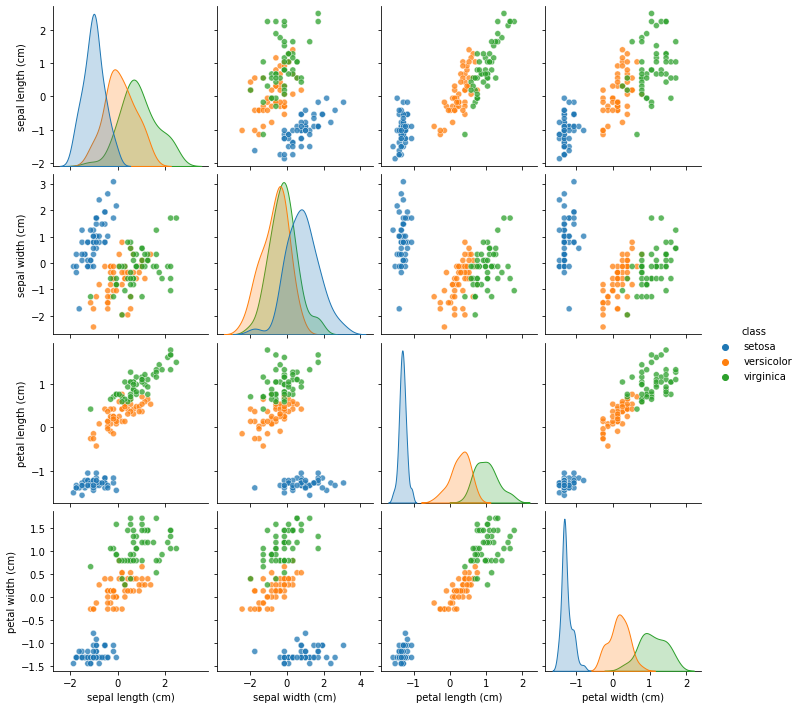

In [14]:
sns.pairplot(scaled_data, hue='class', plot_kws={'alpha': 0.75}, vars=iris.feature_names)
plt.show()

#### MyDBSCAN

In [15]:
time_start = time.time()
#
my_clustering = MyDBSCAN(eps=0.7, min_samples=5)
my_clustering.fit(X_train)
#
time_end = time.time()
my_time = time_end - time_start
print("Time:", my_time)
my_clustering.labels_

Time: 0.019865989685058594


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

In [16]:
len(my_clustering.core_sample_coords_)

127

#### Sci-kit learn DBSCAN

In [ ]:
time_start = time.time()
#
clustering = DBSCAN(eps=0.7, min_samples=5).fit(X_train)
#
time_end = time.time()
sk_time = time_end - time_start
print("Time:", sk_time)
clustering.labels_

In [18]:
len(clustering.core_sample_indices_)

127

#### Check differences between clustering

In [19]:
def find_dif(list1: list, list2: list):
    counter = 0
    indexes = []
    size = min(len(list1), len(list2))
    for i in range(size):
        if list1[i] != list2[i]:
            counter += 1
            indexes.append(i)
    added_indexes = []
    if len(list1)!= len(list2):
        counter += abs(len(list1) - len(list2))
        added_indexes = list(range(size, max(len(list1) - len(list2))))
    indexes += added_indexes
    return counter, indexes

In [20]:
find_dif(my_clustering.labels_, clustering.labels_)

(0, [])

**Result**: no differences in algorithms' outputs

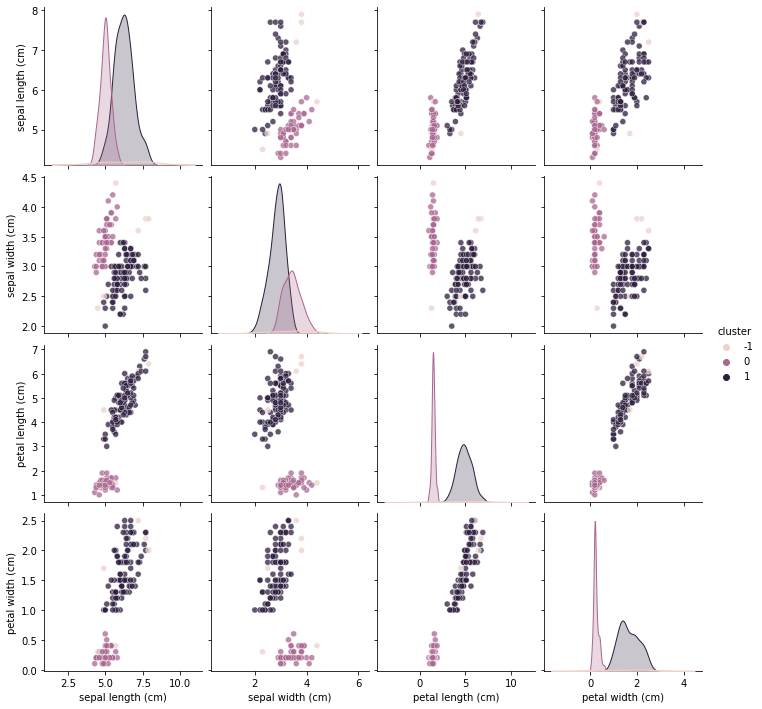

In [21]:
X['cluster'] = my_clustering.labels_
sns.pairplot(X.drop('class', axis=1), hue='cluster', plot_kws={'alpha': 0.75}, vars=iris.feature_names)
plt.show()

Predict

In [22]:
prediction = my_clustering.predict(X_train)
prediction

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

In [23]:
find_dif(my_clustering.labels_, prediction)

(0, [])

In [24]:
print('Time')
print(tb({'MyDBSCAN': my_time, 'Sci-Kit learn': sk_time}.items()))
print('Dif:', sk_time - my_time)

Time
-------------  ----------
MyDBSCAN       0.019866
Sci-Kit learn  0.00612092
-------------  ----------
Dif: -0.01374506950378418


### Conclusion:
* DBSCAN can not correctly define 3 original classes because 'virginica' and 'vercicolor' are much close to each other and have intersections almost in all features (may be besides sepal length)
* But DBSCAN greatly defines 2 clusters which are visually different
* MyDBSCAN gives the same answer as Sci-Kit Learn implementation
* The difference in run time is so small that it is insignificant  
(+ can fluctuate through the executions)


# Part 2

В данном задании вам предлагается проанализировать набор данных по различным городам США. Каждый город характеризуется следующими признаками:

In [25]:
data_desc = pd.read_csv('Data_Description.txt', sep=':')
data_desc

,Attribute,Description
0,Place,"City, state (postal code)"
1,Climate & Terrain,"Very hot and very cold months, seasonal temperature variation, heating- and cooling-degree days, freezing days, zero-degree days, ninety-degree days."
2,Housing,"Utility bills, property taxes, mortgage payments."
3,Health Care & Environment,"Per capita physicians, teaching hospitals, medical schools, cardiac rehabilitation centers, comprehensive cancer treatment centers, hospices, insurance/hospitalization costs index, flouridation of drinking water, air pollution."
4,Crime,"Violent crime rate, property crime rate."
5,Transportation,"Daily commute, public transportation, Interstate highways, air service, passenger rail service."
6,Education,"Pupil/teacher ratio in the public K-12 system, effort index in K-12, accademic options in higher education."
7,The Arts,"Museums, fine arts and public radio stations, public television stations, universities offering a degree or degrees in the arts, symphony orchestras, theatres, opera companies, dance companies, public libraries."
8,Recreation,"Good restaurants, public golf courses, certified lanes for tenpin bowling, movie theatres, zoos, aquariums, family theme parks, sanctioned automobile race tracks, pari-mutuel betting attractions, major- and minor- league professional sports teams, NCAA Division I football and basketball teams, miles of ocean or Great Lakes coastline, inland water, national forests, national parks, or national wildlife refuges, Consolidated Metropolitan Statistical Area access."
9,Economics,"Average household income adjusted for taxes and living costs, income growth, job growth."


### Notes:   
* Для всех признаков, кроме трех, чем выше значение - тем лучше. Для признаков `Housing` и `Crime` - наоборот.
* Признак `Population`- статистический признак, не имеющий интерпретации как “лучше-хуже”.
* Признак `Place` - уникальный идентификатор объекта (города), он не должен использоваться при кластеризации.
* Также в данных присутствуют географические координаты городов - `Longitude` и `Latitude`. Их также не следует использовать при кластеризации данных.

In [26]:
data = pd.read_csv('Data.txt', sep=' ')
data

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350


## Tasks: 

1. Выполните необходимую предобработку данных. Перед кластеризацией исключите из данных признаки `Place`, `Long` и `Lat`.  
  
  
2. Выполните кластеризацию иерархическим методом.  
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации.  
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы. 
  
  
3. Выполните кластеризацию методом Dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.  
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.  
  
  
4. Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.  
  
  
5. (Бонусное) Выполните кластеризацию другими методами. Например, [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) или алгоритмы, [реализованные](https://scikit-learn.org/stable/modules/clustering.html) в scikit-learn.  
  
  
6. В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиений объектов (по одному на каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.  
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).  
  
  
7. Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.  
  
  
8. Оцените, как полученные кластеры распределены географически.  
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?  
(Бонусное) [Провизуализируйте](https://python-visualization.github.io/folium/quickstart.html) распределение на карте США.

## Prerpocessing

In [27]:
data.dtypes

Place           object
Climate          int64
HousingCost      int64
HlthCare         int64
Crime            int64
Transp           int64
Educ             int64
Arts             int64
Recreat          int64
Econ             int64
Long           float64
Lat            float64
Pop              int64
dtype: object

In [28]:
data.isnull().sum()

Place          0
Climate        0
HousingCost    0
HlthCare       0
Crime          0
Transp         0
Educ           0
Arts           0
Recreat        0
Econ           0
Long           0
Lat            0
Pop            0
dtype: int64

In [29]:
drop_labels = ['Lat', 'Long', 'Place']
X_train = data.drop(drop_labels, axis=1)
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_train

array([[-0.14700595, -0.90129655, -0.9473398 , ..., -0.54664636,
         1.94643332, -0.46098997],
       [ 0.30066422, -0.08756979,  0.46956805, ...,  0.97444164,
        -1.08546728,  0.1549497 ],
       [-0.58638594, -0.42305363, -0.56690154, ..., -1.22351192,
        -0.25430354, -0.45934192],
       ...,
       [ 0.01050762,  0.01026216, -0.47204161, ..., -1.24458649,
        -0.53505218, -0.15792504],
       [ 0.25921328, -0.55657536, -0.08860777, ..., -0.64334144,
        -1.50659023,  0.01034969],
       [ 0.57424044, -0.19799814, -0.97230294, ..., -1.15037077,
        -0.76777803, -0.47102737]])

In [30]:
X_train_min_max = data.drop(drop_labels, axis=1)
sc = MinMaxScaler()
X_train_min_max = sc.fit_transform(X_train_min_max)
X_train_min_max

array([[0.51677019, 0.05632812, 0.02484949, ..., 0.24555556, 0.66157174,
        0.00585864],
       [0.58385093, 0.16119258, 0.20660945, ..., 0.51822222, 0.18817592,
        0.0727591 ],
       [0.45093168, 0.11795898, 0.07365185, ..., 0.12422222, 0.31795242,
        0.00603765],
       ...,
       [0.54037267, 0.17380012, 0.08582042, ..., 0.12044444, 0.2741168 ,
        0.03877612],
       [0.57763975, 0.10075212, 0.13500704, ..., 0.22822222, 0.12242249,
        0.05705333],
       [0.62484472, 0.14696174, 0.02164724, ..., 0.13733333, 0.23777938,
        0.00476843]])

In [31]:
X_train_df = pd.DataFrame(data=X_train, columns=data.drop(drop_labels, axis=1).columns)
X_train_df

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,-0.147006,-0.901297,-0.947340,-0.106712,-0.123592,-0.180726,-0.464893,-0.546646,1.946433,-0.460990
1,0.300664,-0.087570,0.469568,-0.210467,0.464411,-1.176652,0.520604,0.974442,-1.085467,0.154950
2,-0.586386,-0.423054,-0.566902,0.025084,-1.158809,-0.795765,-0.628640,-1.223512,-0.254304,-0.459342
3,-0.520064,-0.184142,0.244900,-0.984419,1.844699,1.823613,0.324497,-0.283834,0.312735,0.351765
4,0.997040,0.019500,0.666278,1.463626,1.620402,0.659098,0.290194,0.949648,0.186213,-0.114824
...,...,...,...,...,...,...,...,...,...,...
324,0.192892,0.154701,0.618348,-0.788127,-0.391369,1.511411,-0.294891,-1.160288,-0.448242,-0.133638
325,-0.030943,-0.800525,-0.867458,0.406452,-0.330636,-1.011185,-0.464893,0.364519,-0.498112,-0.391956
326,0.010508,0.010262,-0.472042,-1.461129,-1.341007,0.275089,-0.459284,-1.244586,-0.535052,-0.157925
327,0.259213,-0.556575,-0.088608,-0.064649,-0.577017,0.328164,-0.076347,-0.643341,-1.506590,0.010350


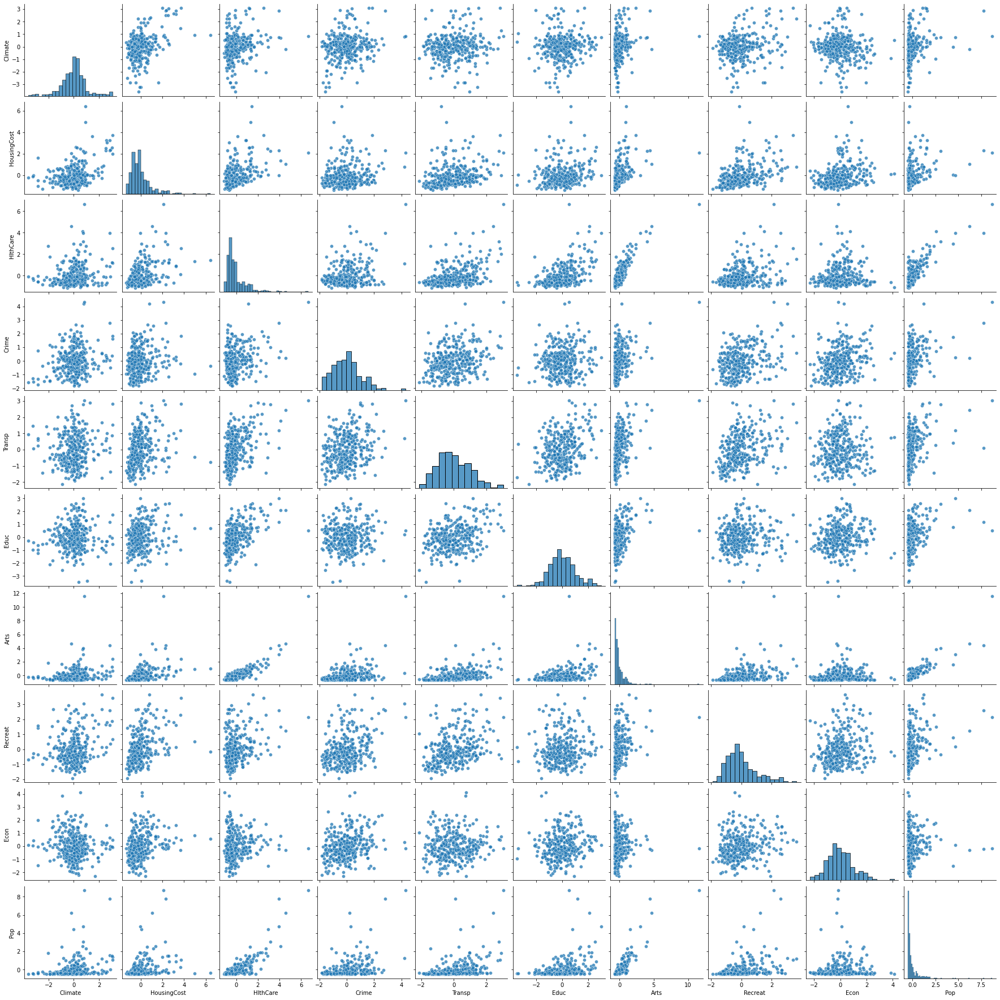

In [32]:
sns.pairplot(X_train_df, plot_kws={'alpha': 0.75}, vars=X_train_df.columns)
plt.show()

In [33]:
def draw_clustering_results(data, labels):
    new_data = data.copy()
    new_data['cluster'] = labels
    sns.pairplot(new_data, hue='cluster', plot_kws={'alpha': 0.75}, vars=data.columns)
    plt.show()

## Hierarchical

In [34]:
h_labels_all = dict()

### Ward + Euclidean

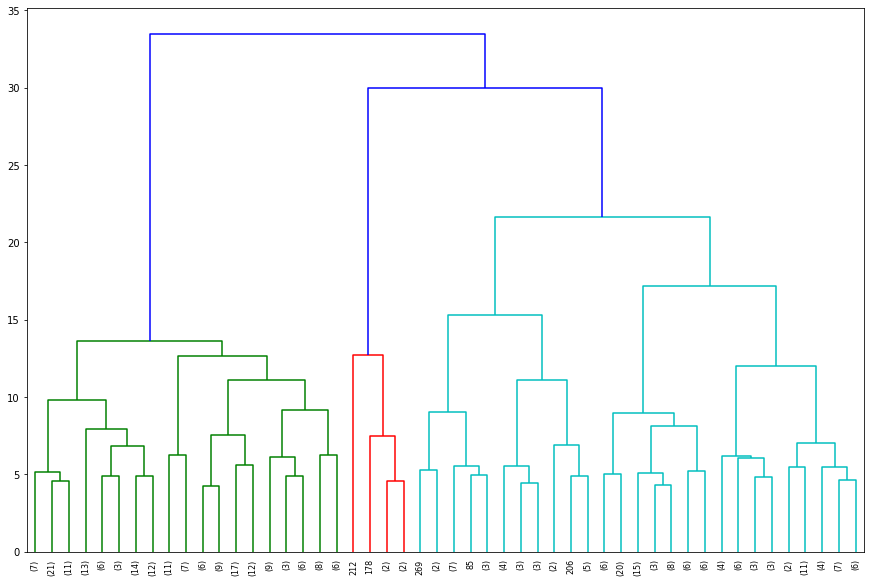

In [35]:
h_clustering = hierarchy.linkage(X_train, method='ward', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

In [36]:
h_labels_euc_ward = hierarchy.fcluster(h_clustering, t=3, criterion='maxclust')
h_labels_all["h_labels_euc_ward"] = h_labels_euc_ward
h_labels_euc_ward

array([3, 1, 1, 3, 3, 1, 1, 1, 1, 1, 3, 3, 1, 1, 3, 1, 1, 1, 1, 3, 3, 1,
       1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 1, 3, 3, 1, 1, 3, 1, 1, 3, 1, 2, 3,
       3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 3, 1, 1, 1, 3, 1, 1, 3, 3, 1, 2, 1,
       3, 1, 3, 3, 3, 3, 1, 3, 3, 1, 3, 3, 1, 1, 3, 3, 1, 3, 3, 3, 1, 1,
       1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3,
       1, 1, 3, 3, 3, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 3, 3, 1,
       3, 1, 3, 1, 1, 3, 3, 1, 3, 3, 1, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 3,
       1, 1, 1, 3, 3, 3, 1, 1, 3, 1, 3, 1, 1, 3, 1, 1, 1, 1, 3, 1, 3, 3,
       1, 1, 2, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 3, 1, 3, 3, 3, 3, 2, 3, 1, 1, 3, 3, 3, 3,
       3, 1, 3, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 2, 3, 1, 3, 1, 3, 3, 3, 1,
       3, 1, 1, 1, 3, 1, 1, 3, 1, 3, 3, 1, 1, 3, 1, 3, 1, 1, 1, 3, 1, 1,
       3, 1, 3, 3, 3, 3, 3, 3, 3, 1, 3, 1, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1,
       3, 3, 1, 3, 1, 1, 1, 3, 3, 3, 3, 1, 1, 3, 1,

### Ward + Euclidean V2

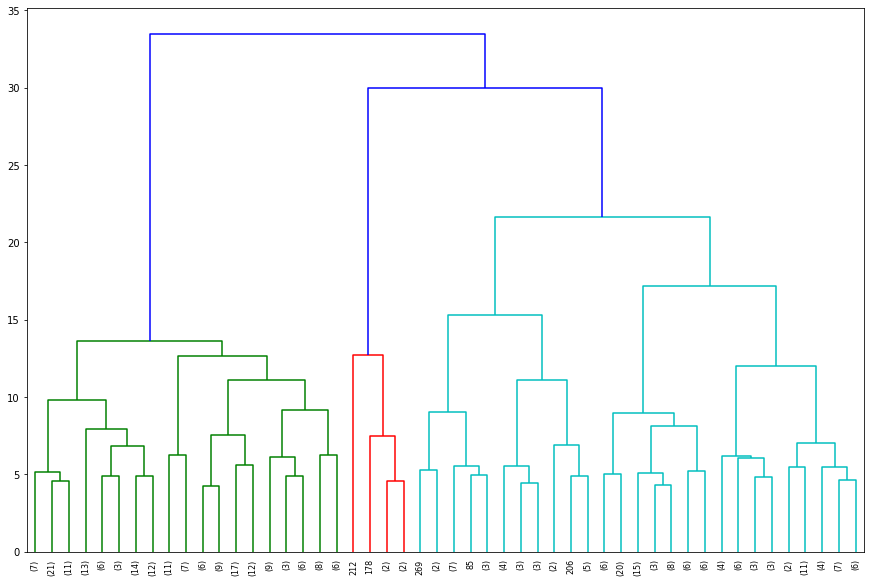

In [37]:
h_clustering = hierarchy.linkage(X_train, method='ward', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

Let's try 4 clusters

In [38]:
h_labels_euc_ward_v2 = hierarchy.fcluster(h_clustering, t=4, criterion='maxclust')
h_labels_all["h_labels_euc_ward_v2"] = h_labels_euc_ward_v2
h_labels_euc_ward_v2

array([4, 1, 1, 4, 4, 1, 1, 1, 1, 1, 3, 4, 1, 1, 4, 1, 1, 1, 1, 3, 4, 1,
       1, 4, 1, 3, 4, 4, 1, 4, 1, 1, 1, 3, 4, 1, 1, 4, 1, 1, 4, 1, 2, 4,
       4, 1, 1, 3, 1, 4, 1, 4, 4, 1, 4, 1, 1, 1, 4, 1, 1, 4, 4, 1, 2, 1,
       4, 1, 3, 4, 4, 4, 1, 4, 4, 1, 3, 3, 1, 1, 4, 4, 1, 3, 4, 3, 1, 1,
       1, 4, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4,
       1, 1, 4, 4, 4, 1, 4, 4, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 4, 4, 1,
       3, 1, 3, 1, 1, 4, 4, 1, 4, 4, 1, 1, 4, 1, 1, 4, 1, 4, 1, 4, 4, 4,
       1, 1, 1, 4, 4, 4, 1, 1, 4, 1, 4, 1, 1, 4, 1, 1, 1, 1, 4, 1, 4, 4,
       1, 1, 2, 4, 1, 1, 1, 1, 4, 1, 1, 1, 1, 4, 4, 3, 3, 4, 4, 3, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 4, 3, 1, 4, 4, 4, 4, 2, 3, 1, 1, 3, 3, 4, 4,
       4, 1, 4, 1, 4, 1, 3, 1, 1, 1, 1, 1, 1, 2, 4, 1, 3, 1, 4, 4, 4, 1,
       4, 1, 1, 1, 4, 1, 1, 4, 1, 4, 4, 1, 1, 4, 1, 4, 1, 1, 1, 3, 1, 1,
       3, 1, 4, 4, 3, 3, 3, 3, 3, 1, 4, 1, 1, 3, 1, 1, 1, 4, 1, 1, 1, 1,
       4, 4, 1, 3, 1, 1, 1, 4, 4, 4, 4, 1, 1, 4, 1,

### Complete + Euclidean

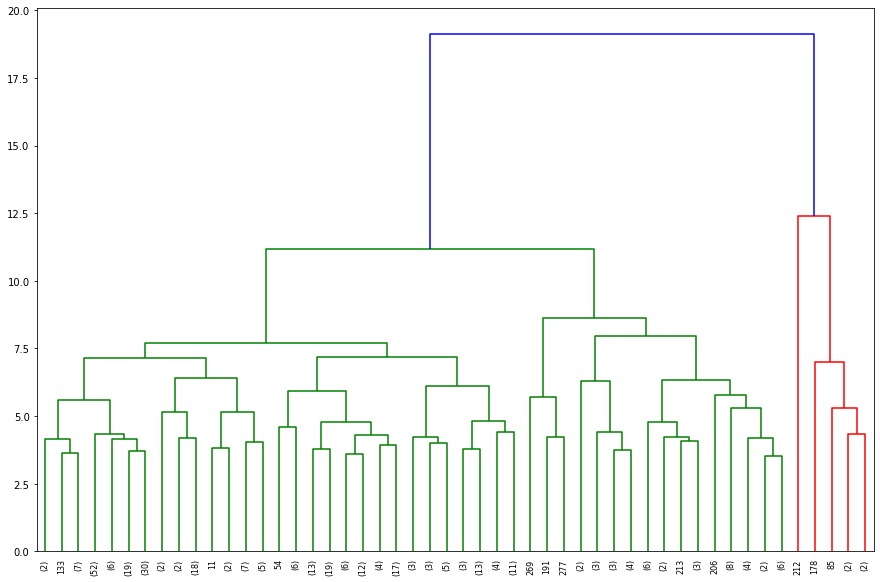

In [39]:
h_clustering = hierarchy.linkage(X_train, method='complete', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

In [40]:
h_labels_euc_comp = hierarchy.fcluster(h_clustering, t=4, criterion='maxclust')
h_labels_all["h_labels_euc_comp"] = h_labels_euc_comp
h_labels_euc_comp

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 3, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 1,
       1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 4, 2, 1, 2, 2, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 3, 1, 1, 2, 1, 1, 2, 1, 1,
       2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2,
       2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

**Output**: The 4th cluster consits only of one element (212 element - left red line)

### Complete + Cos

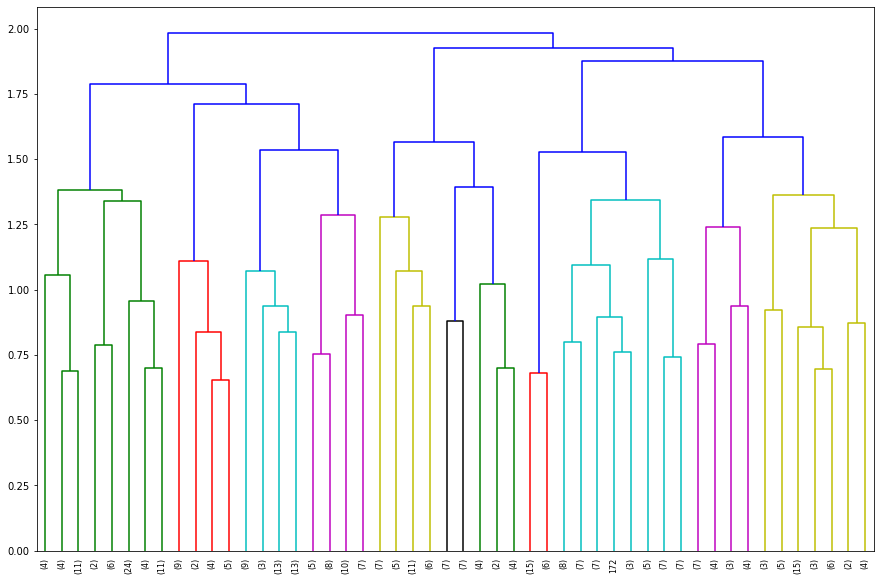

In [41]:
h_clustering = hierarchy.linkage(X_train, method='complete', metric='cosine')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

In [42]:
h_labels_cos_comp = hierarchy.fcluster(h_clustering, t=10, criterion='maxclust')
h_labels_all["h_labels_cos_comp"] = h_labels_cos_comp
h_labels_cos_comp

array([ 2, 10,  3,  8,  8,  3,  1,  1,  1,  9,  5,  6,  1,  3,  7,  1, 10,
        1,  4,  8,  6,  3,  6,  2,  4,  8, 10,  4,  9,  4,  1,  5,  4,  7,
       10,  3,  1,  8, 10,  3, 10,  9,  7,  6,  2,  3,  1,  5,  2,  2,  4,
        2,  7,  3, 10,  1,  6, 10,  8,  8,  1,  8,  8,  1,  7,  1,  7,  3,
        7,  6,  9,  8,  1,  7,  4,  1,  8,  5,  3, 10,  8,  6,  1,  8,  6,
        7,  3,  1, 10,  9, 10,  4,  1,  3,  2,  9,  1,  1,  9, 10,  1,  1,
        3,  9,  1,  1,  5,  6, 10,  2,  3,  3, 10,  6,  6,  1,  8,  5,  9,
        3, 10,  1, 10,  3, 10,  8,  1,  1,  1,  8,  8,  3,  5,  3,  8,  1,
        3,  8,  3,  9,  8, 10,  3,  1,  8,  1,  1, 10,  3, 10,  3,  8,  8,
       10,  2,  1,  1, 10, 10,  6,  4,  5,  4,  1, 10,  3,  4,  6,  4,  6,
        4,  1,  8,  1, 10,  9,  2,  1,  7,  8,  6,  4,  1,  3, 10,  2,  4,
        3,  1,  5,  8,  5,  7,  2,  6,  7,  7,  4,  4,  7,  4,  1,  1,  4,
        2,  8,  7,  4,  8,  8,  2,  8,  7,  7,  9,  7,  5,  5,  4,  2,  6,
        1, 10,  5,  6,  3

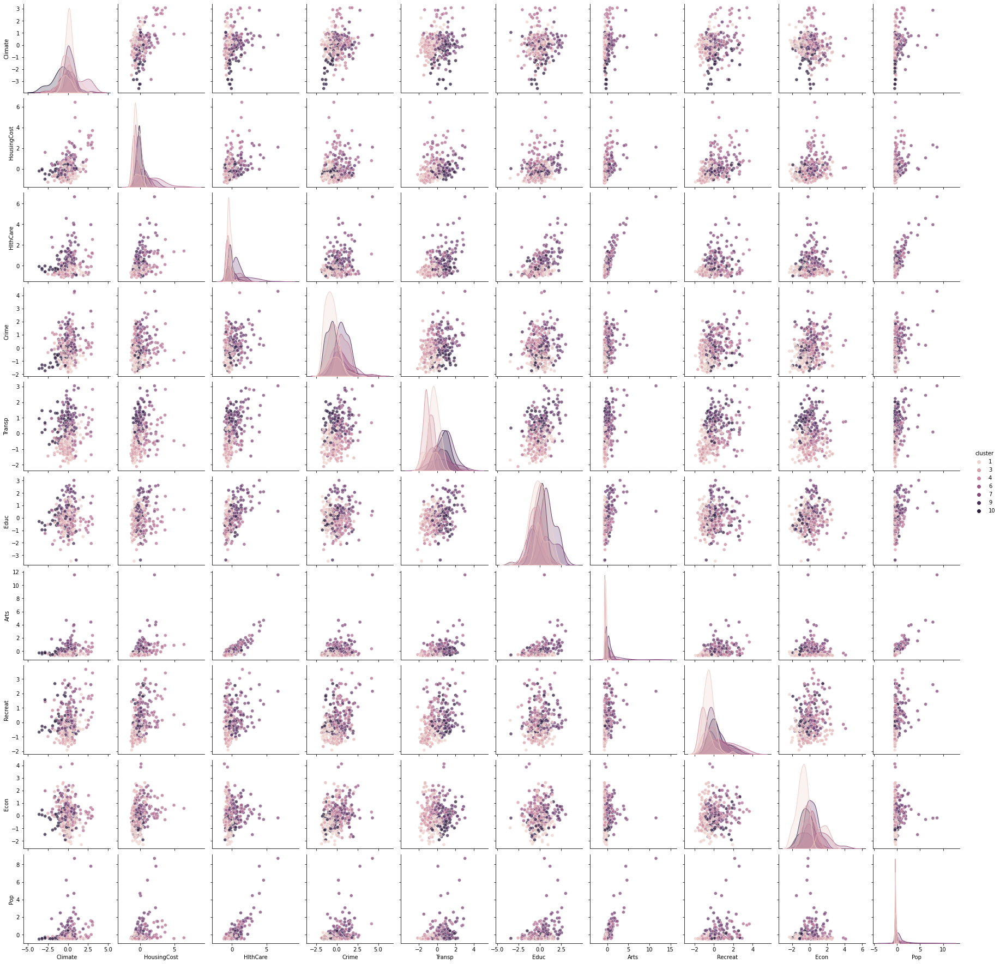

In [43]:
draw_clustering_results(X_train_df, h_labels_cos_comp)

**Output**: by the plots on the main diagonal we can see how all clusters are merged into each other - bad clustering

### Complete + CityBlock

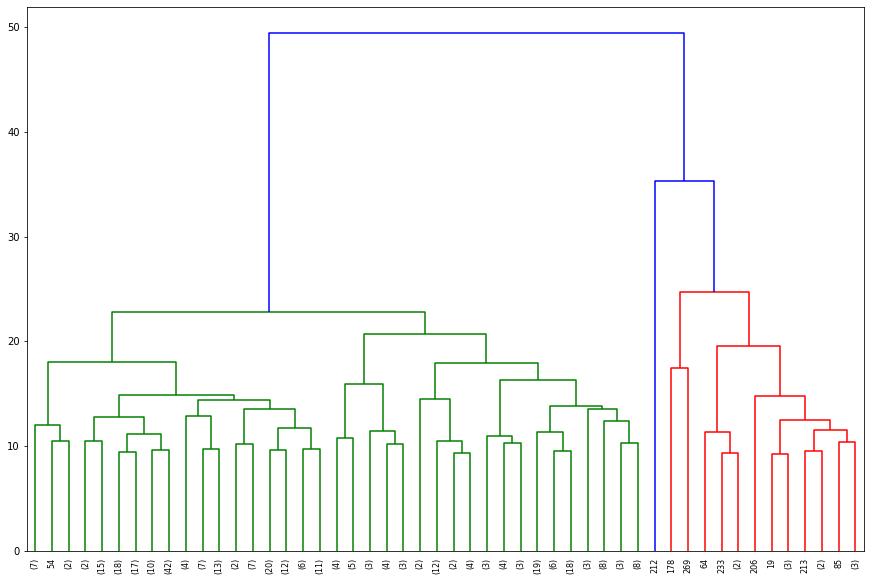

In [44]:
h_clustering = hierarchy.linkage(X_train, method='complete', metric='cityblock')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [45]:
h_labels_cb_comp = hierarchy.fcluster(h_clustering, t=3, criterion='maxclust')
h_labels_all["h_labels_cb_comp"] = h_labels_cb_comp
h_labels_cb_comp

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

**Output**: one of the clusters is one element only as with euclidian metric,  
but now the green part in a plot has a less obvious splitting

### Median + Euclidean

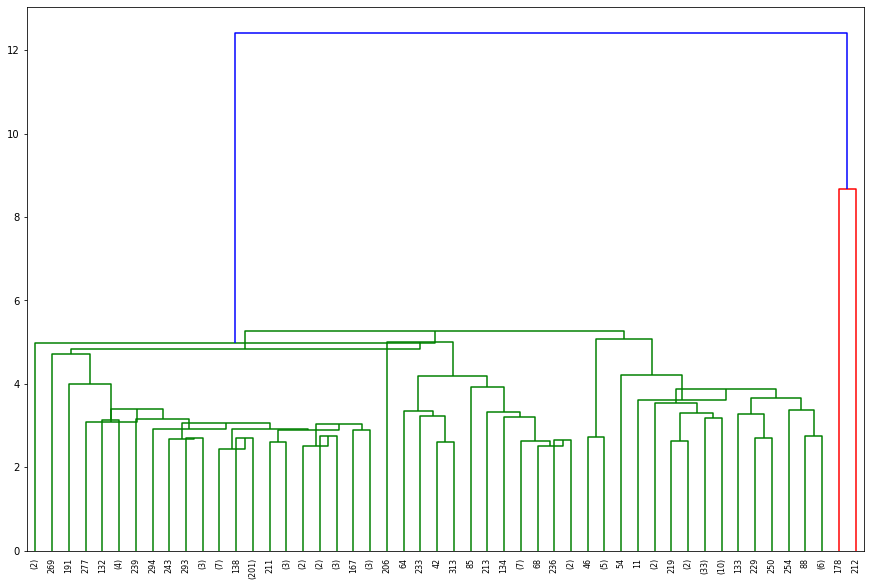

In [46]:
h_clustering = hierarchy.linkage(X_train, method='median', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [47]:
h_labels_euc_med = hierarchy.fcluster(h_clustering, t=2, criterion='maxclust')
h_labels_all["h_labels_euc_med"] = h_labels_euc_med
h_labels_euc_med

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### Weighted + Euclidean

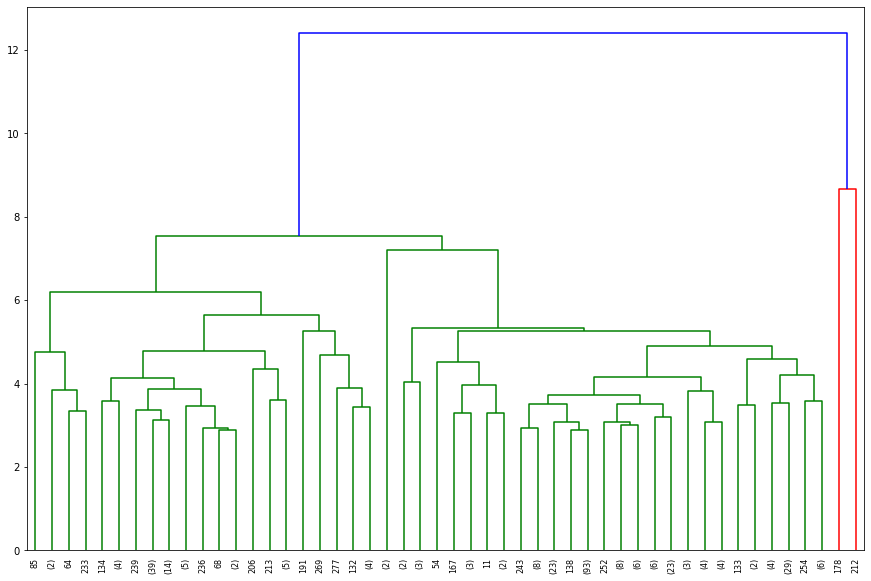

In [48]:
h_clustering = hierarchy.linkage(X_train, method='weighted', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [49]:
h_labels_euc_w = hierarchy.fcluster(h_clustering, t=2, criterion='maxclust')
h_labels_all["h_labels_euc_w"] = h_labels_euc_w
h_labels_euc_w

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### Weighted + CityBlock

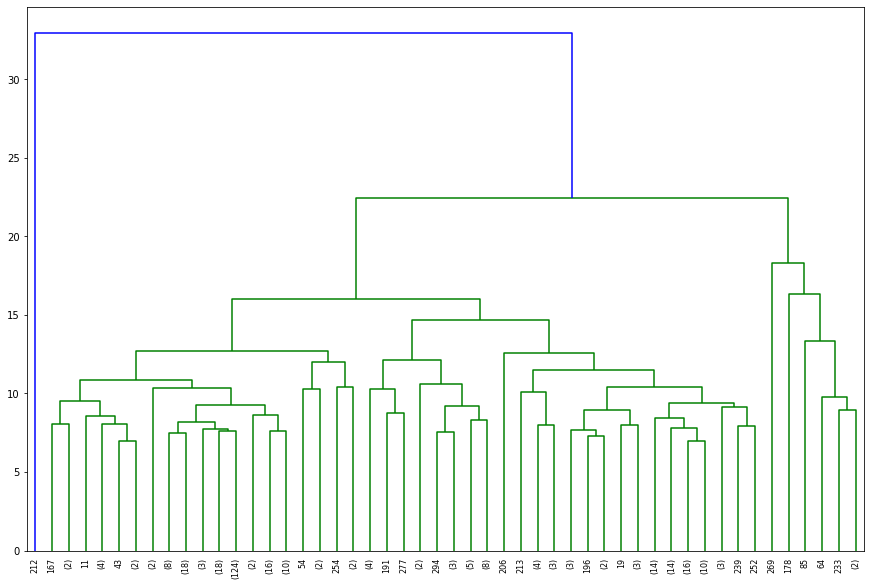

In [50]:
h_clustering = hierarchy.linkage(X_train, method='weighted', metric='cityblock')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(h_clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [51]:
h_labels_cb_w = hierarchy.fcluster(h_clustering, t=3, criterion='maxclust')
h_labels_all["h_labels_cb_w"] = h_labels_cb_w
h_labels_cb_w

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### Results

In [52]:
def compare_clustering(labeling_results: dict, train_data, func=silhouette_score, decrease_order=False):
  table = list()
  for key, value in labeling_results.items():
    score = func(train_data, value)
    table.append((key, score, len(set(value)), [list(value).count(label) for label in set(value)]))

  table = sorted(table, key=lambda row: row[1], reverse=decrease_order)
  print(tb(table, headers=["Metrics", "Score", "Labels", "Distribution"], tablefmt="github"))
  # return [row[1] for row in table]

Metrics

In [53]:
print("silhouette_score")
compare_clustering(h_labels_all, X_train)

silhouette_score
| Metrics              |     Score |   Labels | Distribution                             |
|----------------------|-----------|----------|------------------------------------------|
| h_labels_cos_comp    | 0.0572602 |       10 | [66, 20, 38, 30, 29, 24, 21, 45, 18, 38] |
| h_labels_euc_ward_v2 | 0.148061  |        4 | [181, 6, 32, 110]                        |
| h_labels_euc_ward    | 0.174079  |        3 | [181, 6, 142]                            |
| h_labels_euc_comp    | 0.305314  |        4 | [274, 48, 6, 1]                          |
| h_labels_cb_comp     | 0.444239  |        3 | [310, 18, 1]                             |
| h_labels_cb_w        | 0.556204  |        3 | [321, 7, 1]                              |
| h_labels_euc_med     | 0.721022  |        2 | [327, 2]                                 |
| h_labels_euc_w       | 0.721022  |        2 | [327, 2]                                 |


In [54]:
print("davies_bouldin_score")
compare_clustering(h_labels_all, X_train, davies_bouldin_score, decrease_order=True)

davies_bouldin_score
| Metrics              |    Score |   Labels | Distribution                             |
|----------------------|----------|----------|------------------------------------------|
| h_labels_cos_comp    | 1.885    |       10 | [66, 20, 38, 30, 29, 24, 21, 45, 18, 38] |
| h_labels_euc_ward_v2 | 1.8469   |        4 | [181, 6, 32, 110]                        |
| h_labels_euc_ward    | 1.63867  |        3 | [181, 6, 142]                            |
| h_labels_euc_comp    | 1.15806  |        4 | [274, 48, 6, 1]                          |
| h_labels_cb_comp     | 0.799998 |        3 | [310, 18, 1]                             |
| h_labels_cb_w        | 0.637066 |        3 | [321, 7, 1]                              |
| h_labels_euc_med     | 0.508665 |        2 | [327, 2]                                 |
| h_labels_euc_w       | 0.508665 |        2 | [327, 2]                                 |


Euclidean and Ward (3 labels)

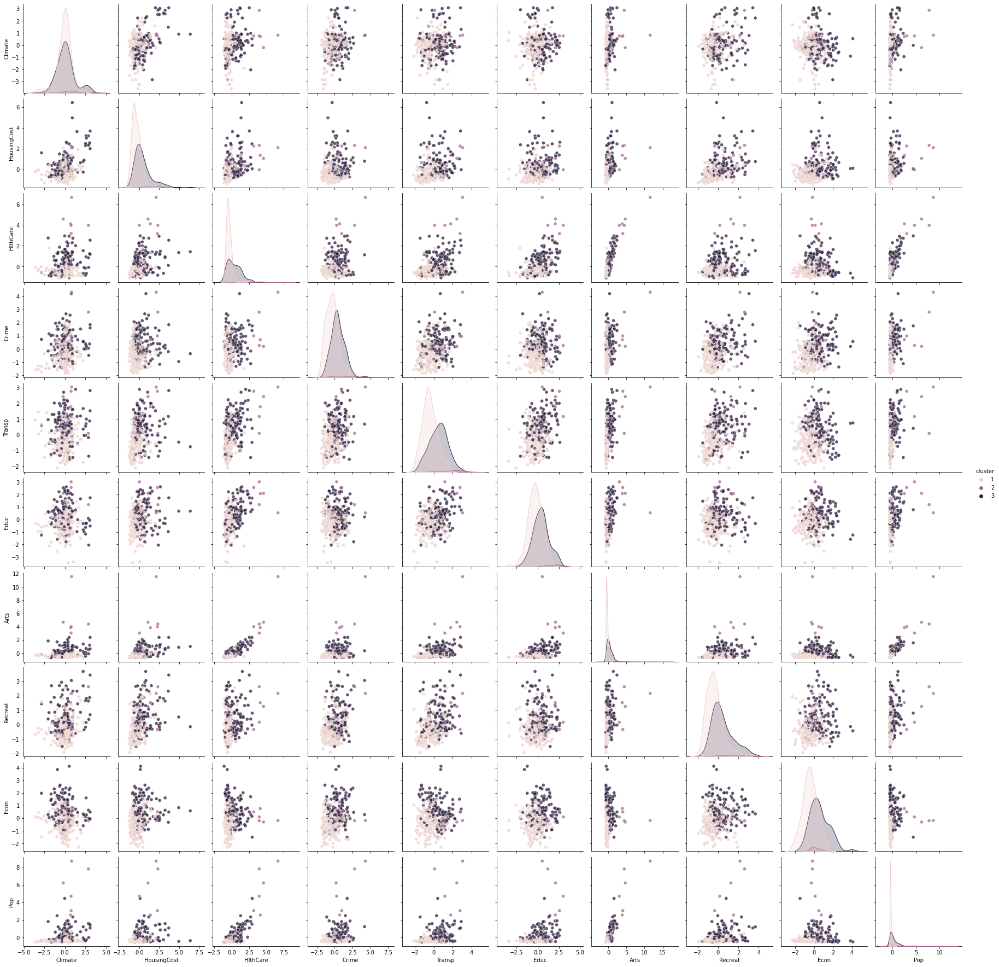

In [55]:
draw_clustering_results(X_train_df, h_labels_euc_ward)

CityBlocks and Complete

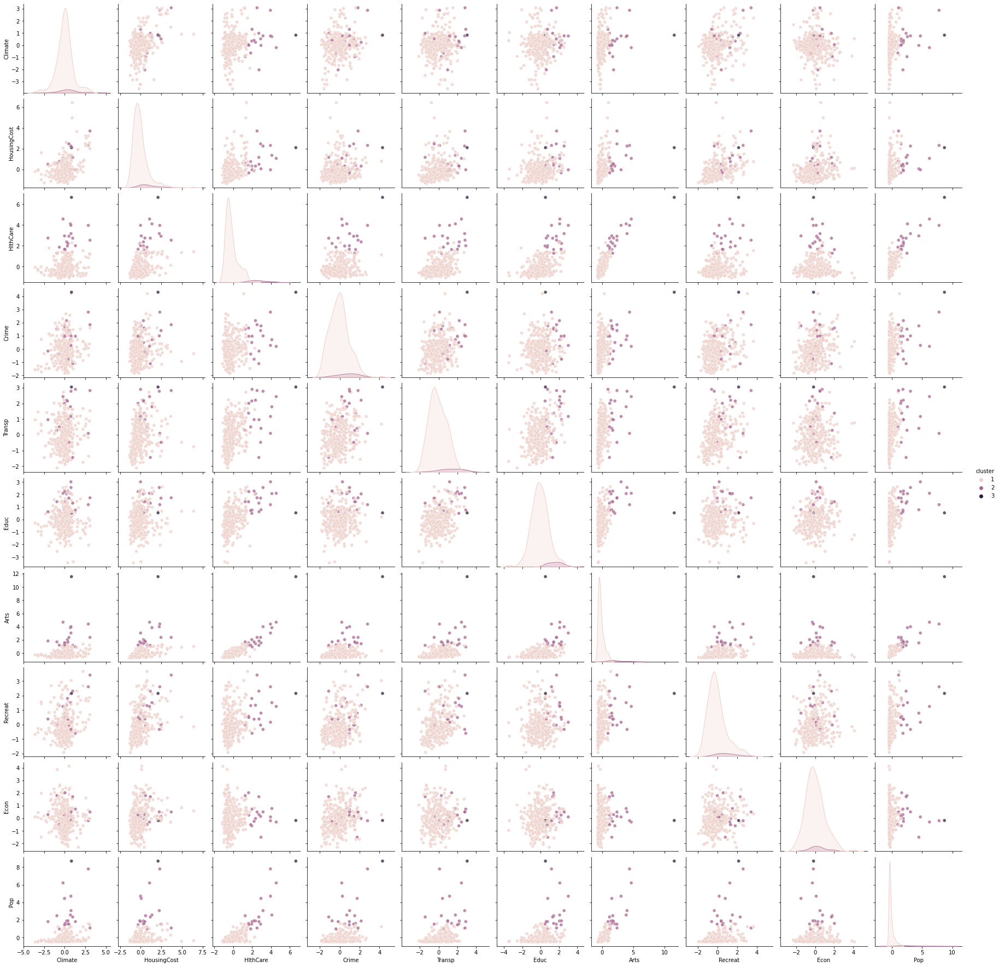

In [56]:
draw_clustering_results(X_train_df, h_labels_cb_comp)

### Conclusion:
Many of variants of clustering have highly uneven distribution (1 huge cluster) or bad metric score.  
I prefer:
* (Ward + Euclidean) - acceptable distribution between clusters, mean score, some clusters' features can be seen visually
* (Complete + CityBlock) - noticeable visual splitting (cluster with high dencity of objects, low dencity and one super-special object, not similar to others), high score.  

## DBSCAN

In [57]:
dbs_labels_all = dict()

In [58]:
def dbscan_clustering(eps=1.5, min_samples=5, metric='euclidean'):
  dbscan_clustering = MyDBSCAN(eps=eps
                               , min_samples=min_samples
                               , metric=metric)
  dbscan_clustering.fit(X_train)

  print("Clusters num:", np.max(dbscan_clustering.labels_) + 1)
  outliers_num = list(dbscan_clustering.labels_).count(-1)
  print("Outliers num:", outliers_num
        , '|', str(outliers_num/len(dbscan_clustering.labels_)*100)[:4]+'%')
  return dbscan_clustering.labels_

### Euclidean

In [59]:
db_labels = dbscan_clustering(eps=1.5, min_samples=5, metric='euclidean')
db_labels

Clusters num: 1
Outliers num: 141 | 42.8%


array([ 0, -1,  0, -1, -1,  0,  0,  0,  0,  0, -1, -1,  0,  0, -1,  0,  0,
        0,  0, -1, -1,  0, -1, -1,  0, -1,  0,  0,  0,  0,  0, -1,  0, -1,
        0,  0,  0,  0, -1,  0,  0,  0, -1, -1,  0,  0, -1, -1, -1,  0, -1,
        0,  0,  0, -1,  0, -1,  0,  0, -1,  0,  0, -1,  0, -1,  0,  0,  0,
       -1, -1, -1, -1,  0,  0,  0,  0, -1, -1,  0,  0,  0, -1,  0, -1,  0,
       -1, -1,  0, -1, -1,  0,  0,  0,  0,  0,  0, -1,  0,  0, -1,  0,  0,
        0, -1,  0,  0, -1, -1, -1, -1,  0,  0,  0, -1, -1,  0, -1, -1,  0,
        0, -1,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0, -1, -1, -1,  0,
        0,  0, -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,
        0, -1,  0,  0,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0, -1,  0, -1,
        0,  0,  0,  0,  0, -1,  0,  0, -1,  0, -1,  0,  0,  0, -1, -1,  0,
       -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1,  0,  0,  0, -1,
       -1,  0, -1,  0,  0, -1, -1, -1, -1, -1,  0, -1, -1, -1,  0, -1, -1,
        0, -1, -1, -1,  0

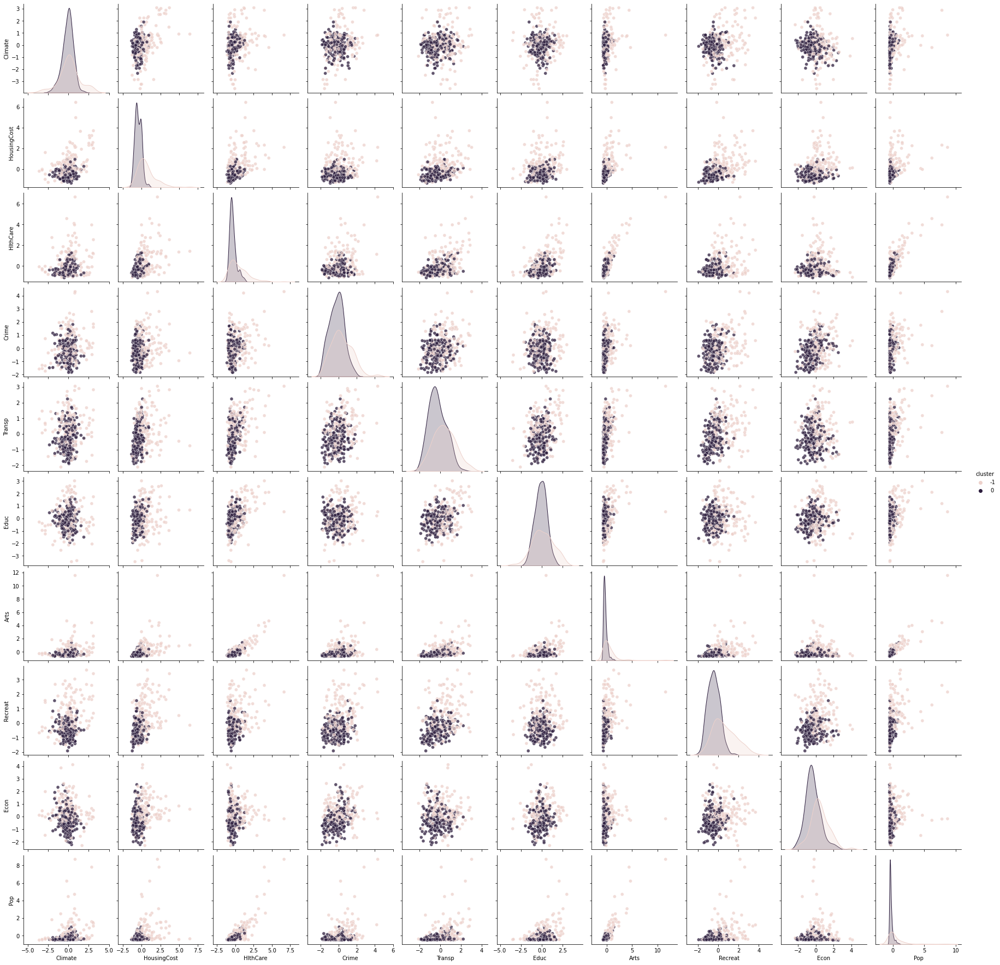

In [60]:
draw_clustering_results(X_train_df, db_labels)

too much outliers and one big cluster -> **increease epsilon and decrease min_sample**

In [61]:
db_labels = dbscan_clustering(eps=2.5, min_samples=3, metric='euclidean')
db_labels

Clusters num: 2
Outliers num: 22 | 6.68%


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1, -1,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
       -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0,  0, -1, -1,  0,  0, -1,  1,  0,  0,  0,
        0,  0,  0,  0,  0

still one big cluster and only few elements of another

### CityBlock

In [62]:
db_labels = dbscan_clustering(eps=2, min_samples=4, metric='cityblock')
db_labels

Clusters num: 0
Outliers num: 329 | 100.%


array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

only outliers :(  
let's try to **increase epsilon** to find core nodes

In [63]:
db_labels = dbscan_clustering(eps=4, min_samples=4, metric='cityblock')
db_labels

Clusters num: 1
Outliers num: 90 | 27.3%


array([ 0,  0,  0, -1, -1,  0,  0,  0,  0,  0, -1, -1,  0,  0, -1,  0,  0,
        0,  0, -1, -1,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0, -1,  0, -1,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0, -1, -1,  0,  0,  0,
        0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0, -1,  0, -1,  0,
       -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0, -1,  0,  0, -1, -1, -1, -1,  0,  0,  0,  0, -1,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1, -1, -1,  0,
        0,  0, -1,  0,  0, -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0, -1, -1,  0, -1, -1, -1,  0,  0, -1,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0, -1, -1, -1,  0, -1, -1, -1,  0, -1,  0,
        0,  0,  0, -1,  0

we have a cluster, but... only one (and outliers)  
now we can **decrease min_samples and increase epsilon a bit**

In [64]:
db_labels = dbscan_clustering(eps=5, min_samples=3, metric='cityblock')
db_labels

Clusters num: 3
Outliers num: 45 | 13.6%


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2, -1,  0,  0,  0,  0,  0,
        0,  0, -1, -1,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0,  1, -1,  0,  0,  0,  0,  0,  1,  0,
       -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1, -1,  1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,  2,  0,  0,  0,
        0,  0,  0,  0,  0

min_sample less 3 means weak connection in the cluster  
not a good act to decrease it

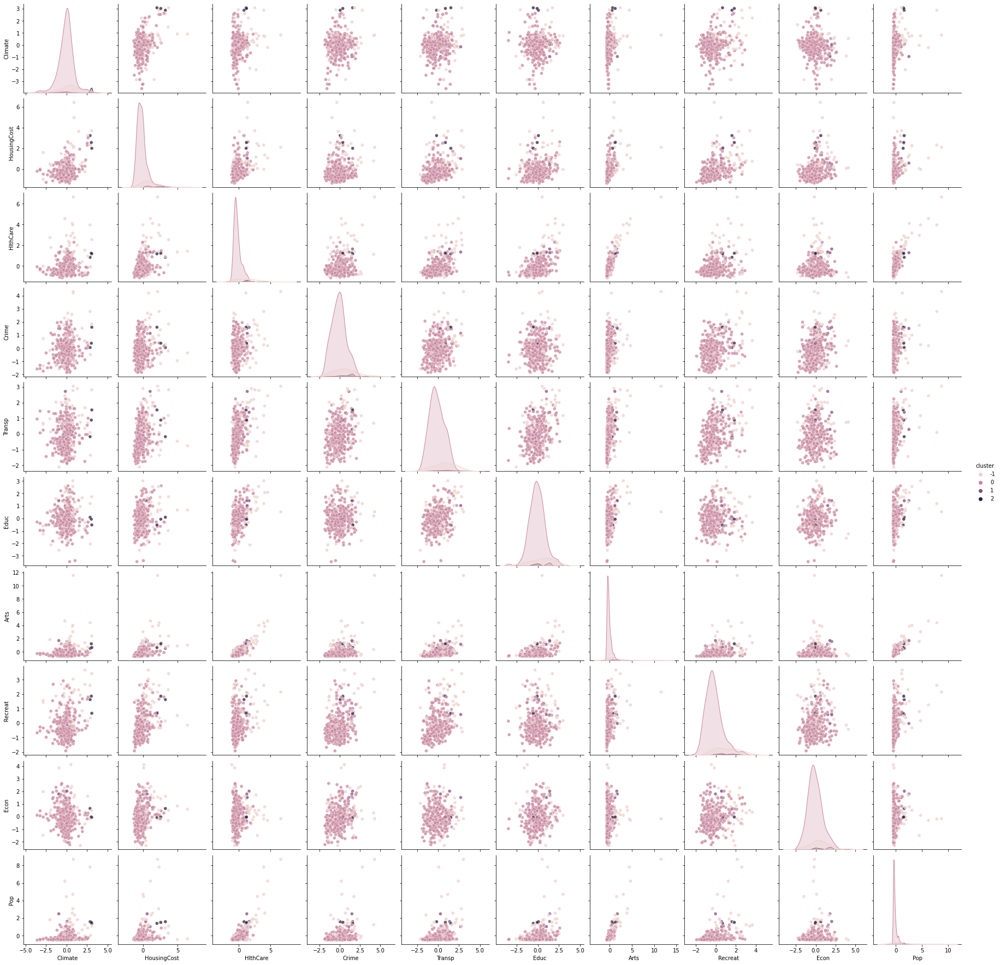

In [66]:
draw_clustering_results(X_train_df, db_labels)

In [67]:
db_labels_cb_5_3 = db_labels

**Output:**  
* clusters have extremely uneven distribution
* clusters intersects
* no visual dependences

### Cosine

In [68]:
db_labels = dbscan_clustering(eps=2, min_samples=5, metric='cosine')
db_labels

Clusters num: 1
Outliers num: 0 | 0.0%


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

even with different arguments - one cluster without outliers

### Conclusion:
DBSCAN in most of variants gives one huge cluster or several tiny cluster with it.
Plus to this DBSCAN consider too many outliers in dataset, sometimes they are more than half.

In my opinion DBSCAN is not a goofd choice for the clustering of such data: 
* Many objects are quite close to each other and algorithm unites them into one big group.  
* On the contrary some stand out objects go to outliers group, but in our case they are not around clusters, but detached from the coomon group and have low dencity  
(that's why the cannot be associated as one or several clusters)  

**p.s.** I could try to change argements in loop but don't see a strong reasons because I consider this algoritm **unsuitable** 


## K-means

In [69]:
def elbow_test(data, clusters_min, clusters_max, seed=10, max_iter=300, n_init=10):
    if clusters_min > clusters_max:
        print("ERROR: 'clusters_min' must be lower than 'clusters_max'")
        return
    if clusters_min < 2:
        print("WARNING: 'clusters_min' must be greater or equal 2")
        clusters_min = 2
    plt.figure(figsize=(15, 10))
    inertia = []
    for i in range(clusters_min, clusters_max):
        clustering = KMeans(n_clusters=i, n_init=n_init, max_iter=max_iter, random_state=seed)
        clustering.fit(data)
        inertia.append(clustering.inertia_)
    plt.plot(range(clusters_min, clusters_max), inertia, 'x-r')
    plt.show()

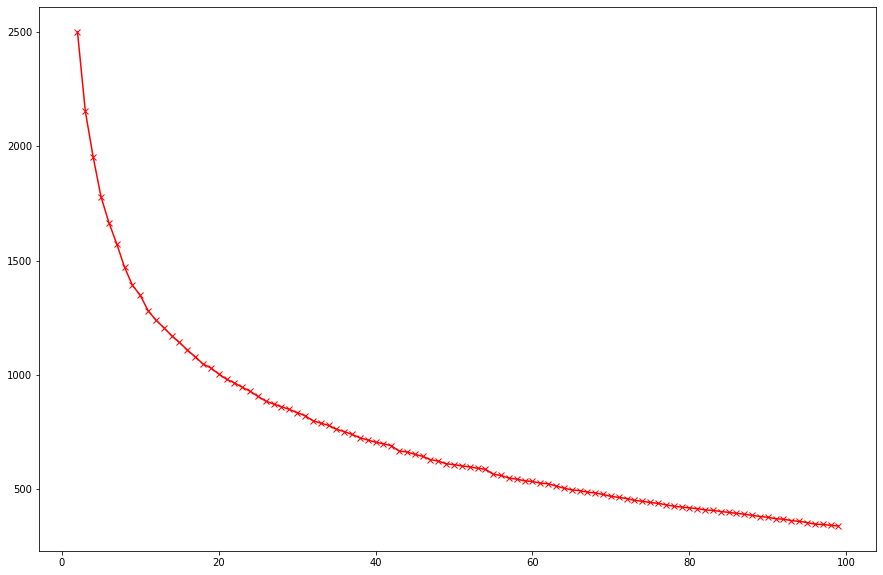

In [70]:
elbow_test(X_train_df, 2, 100)

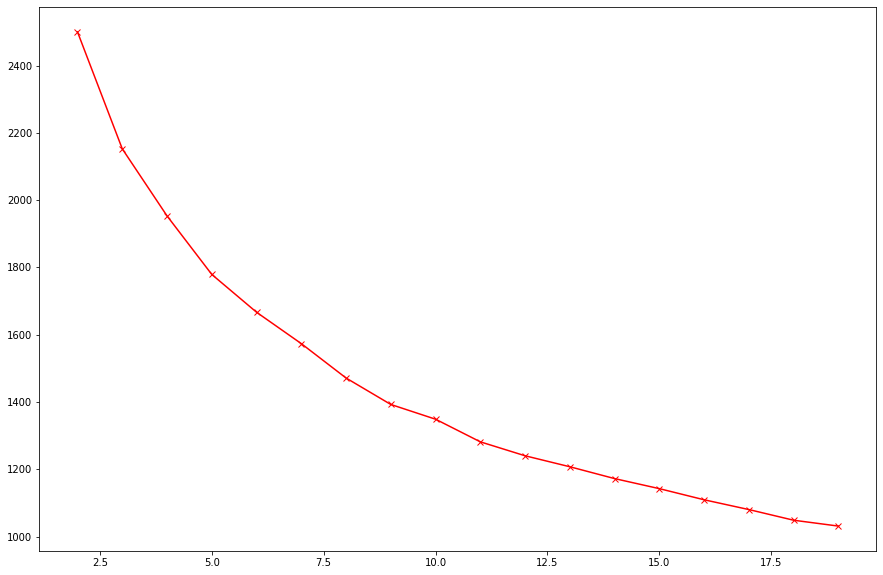

In [71]:
elbow_test(X_train_df, 2, 20)

In [72]:
km_labels_all = dict()

In [73]:
kmeans_clustering = KMeans(n_clusters=5, random_state=13)
kmeans_clustering.fit(X_train)
km_labels_all["km_labels_5"] = km_labels_5 = kmeans_clustering.labels_
km_labels_5

array([2, 4, 0, 4, 4, 0, 0, 4, 0, 4, 1, 2, 0, 0, 1, 0, 0, 4, 0, 1, 2, 0,
       0, 2, 2, 1, 4, 2, 0, 2, 0, 4, 0, 1, 4, 0, 4, 4, 0, 0, 4, 4, 3, 2,
       2, 0, 0, 1, 0, 2, 0, 2, 1, 0, 4, 0, 2, 0, 4, 4, 4, 4, 4, 0, 3, 4,
       1, 0, 1, 2, 0, 4, 0, 4, 2, 0, 1, 1, 0, 0, 4, 2, 0, 1, 4, 3, 0, 0,
       0, 4, 0, 0, 0, 0, 2, 4, 4, 0, 4, 0, 4, 0, 0, 4, 0, 4, 2, 2, 2, 2,
       0, 0, 4, 2, 2, 0, 2, 4, 4, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 4, 1, 0,
       1, 0, 1, 0, 0, 4, 0, 0, 4, 4, 0, 0, 4, 0, 0, 4, 0, 4, 0, 4, 4, 4,
       0, 4, 0, 4, 0, 2, 2, 2, 2, 0, 4, 0, 2, 2, 0, 2, 2, 0, 4, 0, 4, 4,
       2, 0, 3, 4, 2, 2, 4, 0, 4, 2, 0, 0, 0, 2, 4, 1, 1, 4, 2, 1, 1, 4,
       0, 1, 0, 0, 0, 4, 2, 4, 1, 0, 4, 1, 4, 1, 3, 1, 4, 1, 1, 1, 2, 2,
       2, 0, 4, 4, 2, 0, 1, 2, 0, 0, 4, 2, 0, 3, 1, 0, 1, 0, 4, 1, 2, 2,
       1, 0, 0, 0, 1, 0, 4, 4, 0, 4, 1, 4, 0, 1, 0, 4, 0, 0, 0, 1, 4, 4,
       1, 4, 2, 2, 1, 1, 1, 1, 1, 1, 2, 4, 0, 1, 0, 0, 0, 2, 0, 0, 4, 4,
       4, 4, 0, 1, 0, 0, 2, 4, 4, 2, 2, 0, 0, 4, 4,

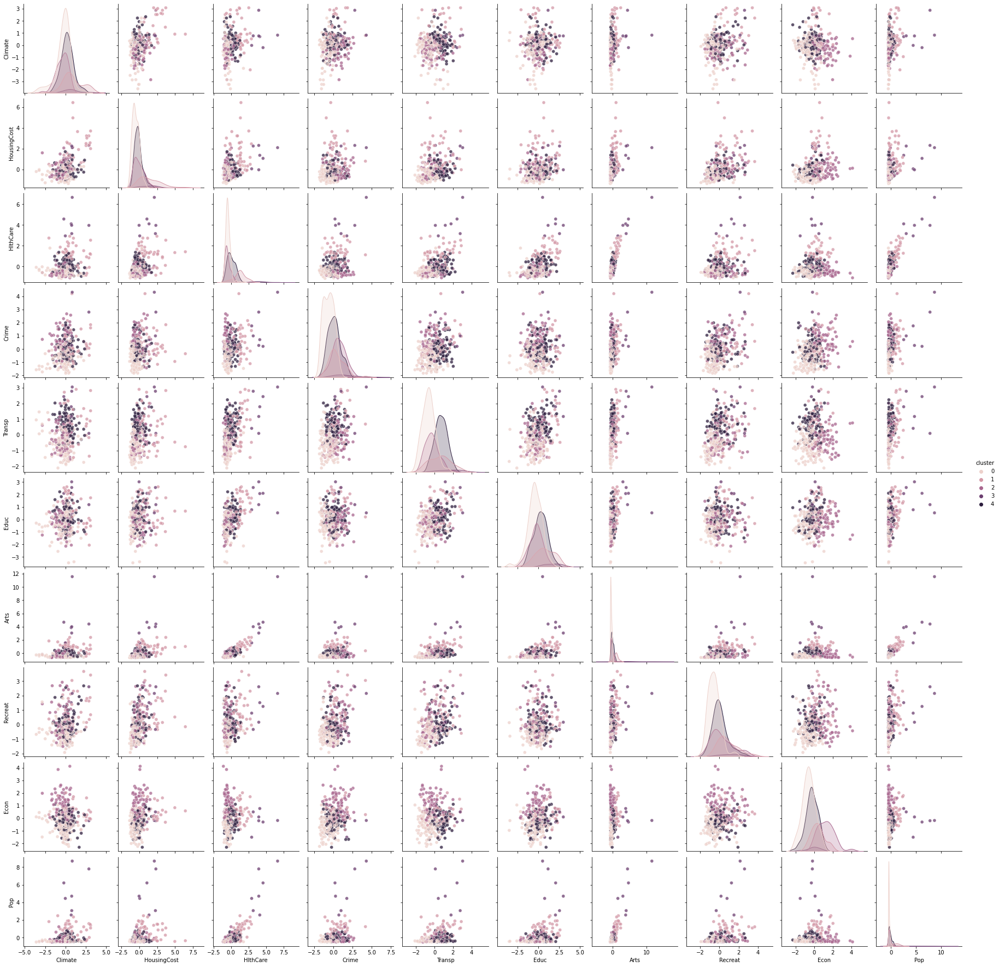

In [74]:
draw_clustering_results(X_train_df, km_labels_5)

In [75]:
kmeans_clustering = KMeans(n_clusters=4, random_state=13)
kmeans_clustering.fit(X_train)
km_labels_all["km_labels_4"] = km_labels_4 = kmeans_clustering.labels_
km_labels_4

array([1, 3, 3, 0, 0, 3, 3, 3, 3, 1, 0, 1, 3, 3, 0, 3, 3, 3, 3, 0, 1, 3,
       3, 1, 1, 0, 3, 1, 3, 1, 3, 3, 3, 0, 1, 3, 3, 3, 3, 3, 3, 3, 2, 0,
       1, 3, 3, 0, 3, 1, 3, 1, 0, 3, 0, 3, 1, 3, 0, 0, 3, 0, 0, 3, 2, 3,
       0, 3, 0, 1, 3, 1, 3, 0, 1, 3, 0, 0, 3, 3, 3, 1, 3, 0, 3, 2, 3, 3,
       3, 1, 3, 3, 3, 3, 1, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1,
       3, 3, 3, 1, 1, 3, 1, 1, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 0, 0, 3,
       0, 3, 0, 3, 3, 0, 3, 3, 3, 1, 3, 3, 0, 3, 3, 3, 3, 3, 3, 1, 0, 3,
       3, 3, 3, 3, 3, 1, 1, 0, 1, 3, 3, 3, 1, 1, 3, 1, 1, 3, 1, 3, 3, 3,
       1, 3, 2, 0, 1, 1, 3, 3, 0, 1, 3, 3, 3, 1, 0, 0, 0, 0, 1, 0, 0, 3,
       3, 0, 3, 3, 3, 3, 1, 0, 0, 3, 1, 0, 1, 0, 2, 0, 3, 0, 0, 0, 1, 1,
       1, 3, 0, 3, 1, 3, 0, 1, 3, 3, 3, 1, 3, 2, 0, 3, 0, 3, 1, 0, 1, 1,
       0, 3, 3, 3, 0, 3, 3, 0, 3, 0, 0, 3, 3, 0, 3, 0, 3, 3, 3, 0, 3, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 3, 0, 3, 3, 3, 1, 3, 3, 3, 3,
       0, 0, 3, 0, 3, 3, 1, 0, 0, 1, 1, 3, 3, 3, 3,

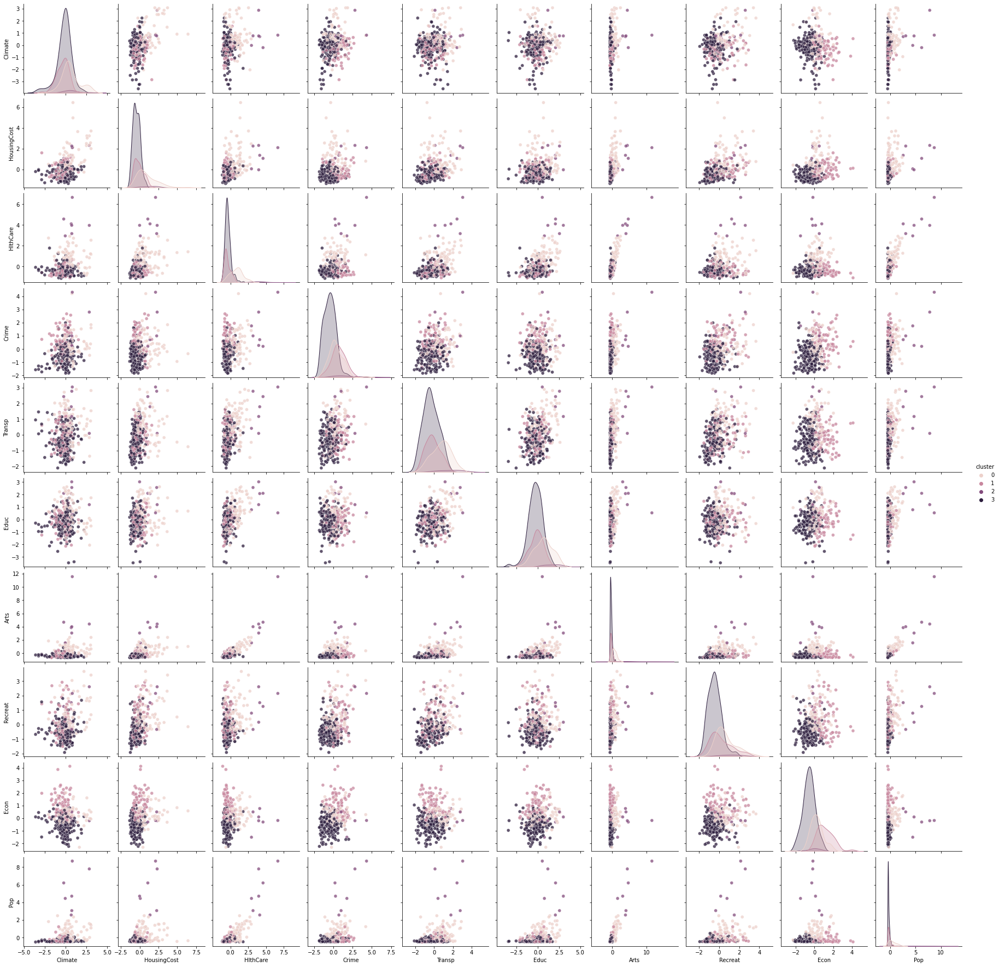

In [76]:
draw_clustering_results(X_train_df, km_labels_4)

In [77]:
kmeans_clustering = KMeans(n_clusters=10, random_state=13)
kmeans_clustering.fit(X_train)
km_labels_all["km_labels_10"] = km_labels_10 = kmeans_clustering.labels_
km_labels_10

array([3, 9, 9, 2, 0, 1, 1, 1, 1, 0, 8, 7, 9, 1, 2, 9, 6, 1, 9, 2, 7, 1,
       9, 3, 0, 2, 6, 3, 9, 3, 1, 9, 9, 2, 6, 9, 1, 0, 6, 1, 6, 9, 5, 7,
       3, 3, 9, 8, 3, 3, 9, 3, 2, 9, 2, 1, 3, 6, 0, 0, 1, 0, 2, 9, 5, 1,
       2, 9, 2, 3, 9, 0, 9, 0, 3, 1, 2, 8, 1, 6, 0, 7, 9, 2, 0, 5, 9, 6,
       6, 0, 6, 9, 9, 1, 3, 9, 0, 1, 9, 6, 0, 9, 1, 0, 9, 0, 7, 7, 7, 3,
       1, 3, 6, 7, 7, 9, 0, 7, 0, 9, 6, 9, 6, 1, 6, 0, 0, 1, 9, 2, 2, 1,
       8, 9, 2, 9, 9, 0, 6, 9, 0, 0, 3, 9, 0, 1, 1, 6, 1, 0, 1, 0, 0, 0,
       3, 9, 1, 6, 6, 3, 9, 8, 0, 1, 0, 1, 0, 7, 9, 3, 9, 9, 0, 9, 6, 0,
       3, 9, 5, 0, 3, 0, 1, 9, 2, 3, 1, 6, 1, 7, 0, 7, 2, 3, 3, 2, 2, 0,
       9, 8, 9, 9, 1, 9, 3, 0, 2, 9, 3, 2, 3, 7, 4, 5, 9, 7, 8, 8, 7, 3,
       3, 9, 2, 3, 7, 9, 8, 9, 9, 9, 1, 0, 9, 5, 7, 9, 2, 1, 7, 2, 3, 3,
       2, 6, 9, 9, 2, 1, 9, 7, 9, 2, 0, 9, 6, 2, 9, 0, 9, 6, 3, 2, 1, 8,
       8, 7, 3, 0, 8, 5, 8, 8, 8, 8, 3, 0, 1, 7, 1, 6, 3, 0, 6, 6, 0, 0,
       0, 0, 9, 8, 1, 1, 9, 2, 7, 0, 7, 1, 1, 0, 0,

In [78]:
print("silhouette_score")
compare_clustering(km_labels_all, X_train, silhouette_score)

silhouette_score
| Metrics      |    Score |   Labels | Distribution                           |
|--------------|----------|----------|----------------------------------------|
| km_labels_10 | 0.132512 |       10 | [55, 50, 31, 41, 1, 8, 29, 26, 18, 70] |
| km_labels_5  | 0.137946 |        5 | [125, 45, 63, 7, 89]                   |
| km_labels_4  | 0.17086  |        4 | [79, 73, 7, 170]                       |


In [79]:
print("davies_bouldin_score")
compare_clustering(km_labels_all, X_train, davies_bouldin_score, decrease_order=True)

davies_bouldin_score
| Metrics      |   Score |   Labels | Distribution                           |
|--------------|---------|----------|----------------------------------------|
| km_labels_5  | 1.71759 |        5 | [125, 45, 63, 7, 89]                   |
| km_labels_4  | 1.61212 |        4 | [79, 73, 7, 170]                       |
| km_labels_10 | 1.46038 |       10 | [55, 50, 31, 41, 1, 8, 29, 26, 18, 70] |


### Conclusion:
I have used Elbow approach of choosing the valid number of clusters for K-Means algorithm.  
On the plot of inertia we can see that significant bend is located near 10 clusters. However it is quite complicated to estimate the quality of clustering by 10 even after concatenating with the geographical feature columns.
So let's limit out plot by 20 clusters. We can watch noticeable cgange in decreasing rate in a point of 5 clusters. I tried K-Means with 4 and 5 clusters in result.
By the scoring and visual analysis I consider the splitting into **4 clusters is the best**

## MeanShift (BONUS)

In [80]:
from sklearn.cluster import estimate_bandwidth

In [81]:
msh_labels_all = dict()

In [82]:
msh_clustering = MeanShift().fit(X_train)
msh_labels_std = msh_clustering.labels_
msh_labels_all['msh_labels_std'] = msh_labels_std
print("Calculated bandwidth:", estimate_bandwidth(X_train))
print("Clusters num:", len(set(msh_labels_std)))
msh_labels_std

Calculated bandwidth: 3.263871811596144
Clusters num: 8


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0,
       0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 6, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 5, 1, 0, 0, 2, 3, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 3, 3, 2, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [83]:
msh_clustering = MeanShift(bandwidth=3).fit(X_train)
msh_labels_3 = msh_clustering.labels_
msh_labels_all['msh_labels_3'] = msh_labels_3
print("Clusters num:", len(set(msh_labels_3)))
msh_labels_3

Clusters num: 11


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,
        0,  0,  2,  7,  0,  0,  0,  0,  2,  0,  0,  0,  0,  0,  0,  0,  1,
        0,  0,  0,  0,  0,  0,  0,  0,  2,  0,  0,  0,  0,  1,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 10,  0,  0,  0,
        9,  0,  0,  0,  0,  0,  0,  0,  2,  1,  0,  0,  0,  0,  0,  2,  0,
        9,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  9,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  4,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  7,  0,  0,  0,  0,  9,  0,  0,  5,  0,  0,  0,  0,
        0,  0,  5,  0,  0,  0,  0,  7,  6,  2,  0,  0,  1,  7,  0,  0,  0,
        0,  0,  0,  0,  0

In [84]:
msh_clustering = MeanShift(bandwidth=4).fit(X_train)
msh_labels_4 = msh_clustering.labels_
msh_labels_all['msh_labels_4'] = msh_labels_4
print("Clusters num:", len(set(msh_labels_4)))
msh_labels_4

Clusters num: 5


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 4, 1, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

### Results

In [85]:
print('silhouette_score')
compare_clustering(msh_labels_all, X_train)

silhouette_score
| Metrics        |    Score |   Labels | Distribution                        |
|----------------|----------|----------|-------------------------------------|
| msh_labels_3   | 0.290908 |       11 | [292, 9, 8, 2, 1, 2, 1, 7, 2, 4, 1] |
| msh_labels_std | 0.333561 |        8 | [298, 10, 9, 4, 1, 1, 5, 1]         |
| msh_labels_4   | 0.41299  |        5 | [308, 11, 8, 1, 1]                  |


In [86]:
print('davies_bouldin_score')
compare_clustering(msh_labels_all, X_train, davies_bouldin_score, True)

davies_bouldin_score
| Metrics        |    Score |   Labels | Distribution                        |
|----------------|----------|----------|-------------------------------------|
| msh_labels_std | 1.22872  |        8 | [298, 10, 9, 4, 1, 1, 5, 1]         |
| msh_labels_3   | 1.1826   |       11 | [292, 9, 8, 2, 1, 2, 1, 7, 2, 4, 1] |
| msh_labels_4   | 0.872698 |        5 | [308, 11, 8, 1, 1]                  |


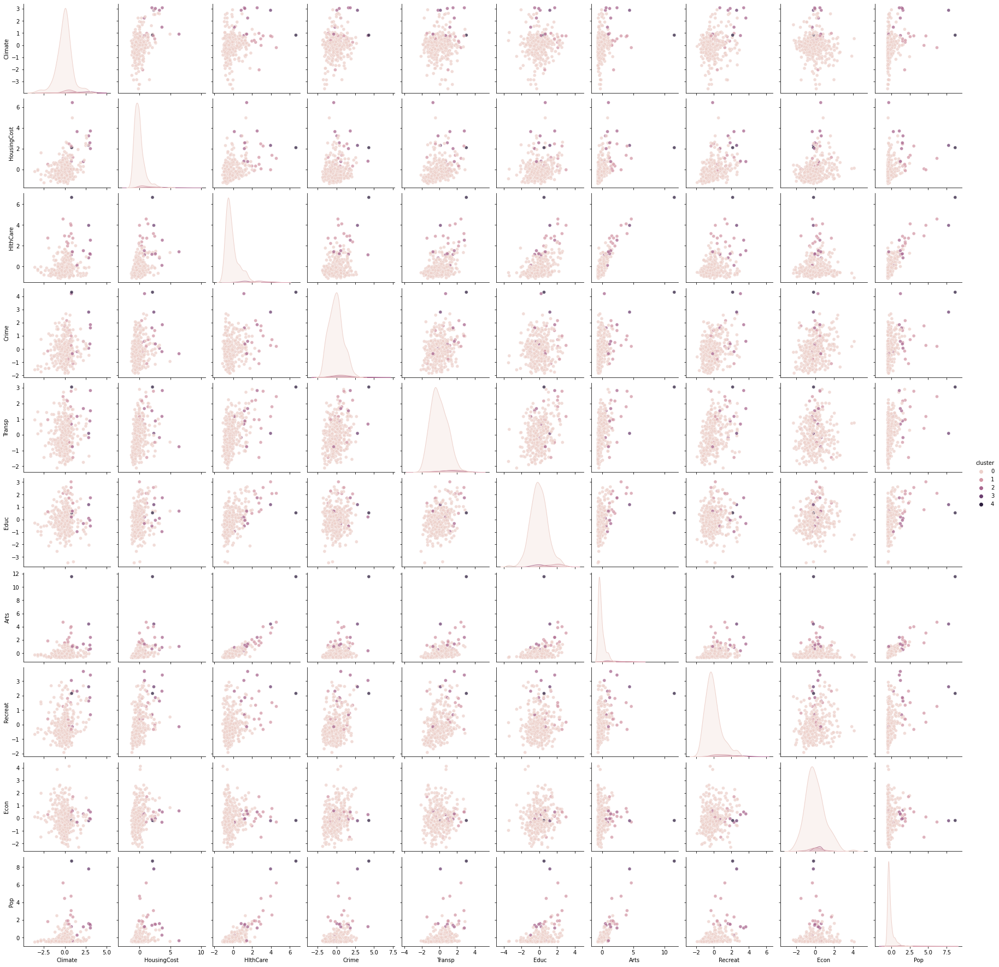

In [87]:
draw_clustering_results(X_train_df, msh_labels_4)

### Conclusion:
MeanShift clustering is quite similar to some we've seen later - one very large cluster and several tiny (2 clusters size of 1)
I belive such clustering **does not stand out for the good result**

## Comparing clusterings

In [88]:
best_labels = {
    'Hierarchical (euc+ward)': h_labels_euc_ward,
    'hierarchical (cb+comp)': h_labels_cb_comp,
    'DBSCAN': db_labels_cb_5_3,
    'K-Means': km_labels_4,
    'MeanShift': msh_labels_4
}

In [89]:
print('silhouette_score')
compare_clustering(best_labels, X_train)

silhouette_score
| Metrics                 |    Score |   Labels | Distribution       |
|-------------------------|----------|----------|--------------------|
| K-Means                 | 0.17086  |        4 | [79, 73, 7, 170]   |
| Hierarchical (euc+ward) | 0.174079 |        3 | [181, 6, 142]      |
| DBSCAN                  | 0.258974 |        4 | [278, 3, 3, 45]    |
| MeanShift               | 0.41299  |        5 | [308, 11, 8, 1, 1] |
| hierarchical (cb+comp)  | 0.444239 |        3 | [310, 18, 1]       |


In [90]:
print('davies_bouldin_score')
compare_clustering(best_labels, X_train, davies_bouldin_score, True)

davies_bouldin_score
| Metrics                 |    Score |   Labels | Distribution       |
|-------------------------|----------|----------|--------------------|
| DBSCAN                  | 2.22633  |        4 | [278, 3, 3, 45]    |
| Hierarchical (euc+ward) | 1.63867  |        3 | [181, 6, 142]      |
| K-Means                 | 1.61212  |        4 | [79, 73, 7, 170]   |
| MeanShift               | 0.872698 |        5 | [308, 11, 8, 1, 1] |
| hierarchical (cb+comp)  | 0.799998 |        3 | [310, 18, 1]       |


In [91]:
print('calinski_harabasz_score')
compare_clustering(best_labels, X_train, calinski_harabasz_score)

calinski_harabasz_score
| Metrics                 |   Score |   Labels | Distribution       |
|-------------------------|---------|----------|--------------------|
| DBSCAN                  | 24.2867 |        4 | [278, 3, 3, 45]    |
| MeanShift               | 34.3234 |        5 | [308, 11, 8, 1, 1] |
| hierarchical (cb+comp)  | 53.7268 |        3 | [310, 18, 1]       |
| Hierarchical (euc+ward) | 72.2153 |        3 | [181, 6, 142]      |
| K-Means                 | 74.4667 |        4 | [79, 73, 7, 170]   |


## Decision
* Unfortunately, Hierarchical (cb+comp) and MeanShift have too large main cluster despite nice Davies-Bouldin and Silhouette score. (Such a good scores can be a result of the uneven distribution in clusters' sizes)
* DBSCAN has the worst scoring in the view of all estimator functions + algorithm has had bad perspective from the very beginning because of cluster propagation feature
* K-Means and Hierarchical (euc+ward) quite similar in metrics and results. 

**Final Choice**:  
I decided to choose **K-Means with 4 clusters** due to lack of serious flaws and disadvantages, good scores and noticeable visual dependencies on pair-plot

P.s. Undoubtedly, it is hard to estimate the quality of clustering without ground truth especially because human's brain **(for now!!!)** cannot see and represent objects in 10 dimensions :)

Now let's add k-means labels to the original Data

In [92]:
data['labels'] = km_labels_4
data.head()

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932,1
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328,3
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402,3
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880,0
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700,0


### Label 1

In [93]:
data[data.labels == 0]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880,0
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700,0
10,"Anaheim-Santa-Ana,CA",885,16047,2025,983,3954,2843,5632,3156,6220,-117.8890,33.7990,1932709,0
14,"Ann-Arbor,MI",546,11014,2508,1067,3433,3346,7559,2288,4579,-83.7500,42.2830,264748,0
19,"Atlanta,GA",696,8316,3195,1308,8409,3057,7559,1362,6315,-84.3190,33.7630,2138231,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293,"Syracuse,NY",548,7670,1040,689,6951,3144,5080,2851,4474,-76.1500,43.0520,642971,0
294,"Tacoma,WA",808,7770,539,1162,4730,2546,4297,4000,4887,-122.4330,47.2370,485643,0
301,"Trenton,NJ",636,10616,1372,1181,4786,3311,5029,1646,5772,-74.7670,40.2250,307863,0
307,"Vallejo-Fairfield-Napa,CA",821,10503,1079,964,4153,2498,2962,1559,5819,-122.1940,38.2200,334402,0


* high population
* high housing cost
* good transport  

**Prediction:** may be big cities, but definitely not the largest

### Label 2

In [94]:
data[data.labels == 1]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.55900,110932,1
9,"Amarillo,TX",609,6546,669,1073,4902,2852,1235,1109,6241,-101.8490,35.38300,173699,1
11,"Anchorage,AK",195,12175,601,1223,5091,2414,2346,3000,7668,-127.2016,48.88046,174431,1
20,"Atlantic-City,NJ",615,11074,637,1878,3556,2929,621,2711,8107,-74.4380,39.36700,276385,1
23,"Austin,TX",435,8831,782,1049,3670,3063,5355,1063,7439,-97.7420,30.28200,536688,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,"Waco,TX",412,6106,538,1166,3018,2867,1141,1248,6259,-97.1420,31.54700,170755,1
317,"West-Palm-Beach-Boca-Raton-Delray-Beach,FL",509,10512,375,1783,5201,3224,2888,3772,7992,-80.2177,26.65530,576863,1
319,"Wichita,KS",494,7061,806,1164,3933,2981,2987,1508,6036,-97.3370,37.69200,411313,1
320,"Wichita-Falls,TX",456,6404,549,1179,2793,2747,599,1126,6805,-98.5130,33.91000,121082,1


* low health care
* low population
* nice economy score  
* low transport

**Prediction** : may be some cities in remote or tourist-resort zones 

### Label 3

In [95]:
data[data.labels == 2]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
42,"Boston,MA",623,11609,5301,1215,6801,3479,21042,3066,6363,-71.058,42.3620,2805911,2
64,"Chicago,IL",514,10913,5766,1034,7742,3486,24846,2856,5205,-87.625,41.8830,6060387,2
85,"Detroit,MI",536,8525,4142,1587,4808,3064,10389,2483,3904,-83.128,42.4420,4488072,2
178,"Los-Angeles,Long-Beach,CA",885,13868,5153,1960,4345,3195,23567,3948,5316,-118.217,33.9165,7477503,2
212,"New-York,NY",638,13358,7850,2498,8625,2984,56745,3579,5338,-73.880,40.8490,8274961,2
233,"Philadelphia,PA-NJ",630,8310,5158,1059,5903,3781,17270,1979,5638,-75.163,39.9500,4716818,2
313,"Washington,DC-MD-VA",631,13724,4361,1317,8236,3635,21701,1578,6072,-77.033,38.8920,3250822,2


* the largiest population
* the largiest housing
* the best art objects  
* high crime  

**Prediction**: The smallest cluster, but the largiest cities of America. Because of group size I can see all of the examples at once and be sure.

### Label 4

In [96]:
data[data.labels == 3]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328,3
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402,3
5,"Alexandria,LA",520,5819,640,727,2444,2972,334,1018,5254,-92.4530,31.3020,135282,3
6,"Allentown,Bethlehem,PA-NJ",559,8288,621,514,2881,3144,2333,1117,5097,-75.4405,40.6155,635481,3
7,"Alton,Granite-City,IL",537,6487,965,706,4975,2945,1487,1280,5795,-90.1615,38.7940,268229,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918,3
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508,3
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255,3
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350,3


* lowest economy (but difference is not large)
* sometimes **VERY** low health care (200-300)
* bad transport
* low crime  

**Prediction:** small towns

## Map

In [97]:
import folium

markers = {0: "red",
           1: "green",
           2: "blue",
           3: "orange"}

_map = folium.Map(location=[39.091431, -96.655998], zoom_start=4)

for index, example in data.iterrows():
    folium.Marker(location=(example.Lat, example["Long"])
                  , icon=folium.Icon(color=markers[example["labels"]]),
                  ).add_to(_map)
_map

### Map conclusion:
* <font color='cyan'>Blue cities</font> - the largiest cities of the USA. We can see such examples as LA, NY, Washington, Philadelphia, Boston, Detroit etc.
* <font color='red'>Red cities</font> - next (after blue labels) largiest cities, often located in the neighborhood of blue cities or are the centers/capitals of states. Examples - Atlanta, Memphis, SF, Tijuana, Kansas City, Houstine
* <font color='green'>Green cities</font> - most of them are located in the south of the USA - Texas, Florida. It means that one the most influential feature has been climate
* <font color='orange'>Orange cities</font> - all other cities. They can be found all over the central part of the country. I can interpret this cluster as small cities or even towns without any significant characteristic of high level of life.


# Overall conclusion
I believe that the results of clusterization are nice especially after applying labels on geographical map.  
Most zones of cluster locations have logical and obvious features.